<h1 style = 'color: green; font-size: 36px; font-weight: bold;'> Aplicação de Algoritmo não supervisionado</h1>


O objetivo dessa modelagem e estudar o algoritmo de K-means para clusterizar clientes

## Base de dados Credit Card Dataset - Kaggle
### Disponível em: <a href= "https://www.kaggle.com/datasets/arjunbhasin2013/ccdata"> Credit Card Dataset</a>

### Dicionário de dados:
CUST_ID: Identificação do titular do cartão de crédito - Categórico
BALANCE: Valor do saldo restante na conta do usuário para fazer compras
BALANCE_FREQUENCY: Com que frequência o saldo é atualizado, pontuação entre 0 e 1 (1 = atualizado com frequência, 0 = não atualizado com frequência)
PURCHASES: Valor das compras feitas na conta
ONEOFF_PURCHASES: Valor máximo de compra feito em uma única transação
INSTALLMENTS_PURCHASES: Valor das compras feitas em parcelas
CASH_ADVANCE: Dinheiro adiantado dado pelo usuário
PURCHASES_FREQUENCY: Com que frequência as compras são feitas, pontuação entre 0 e 1 (1 = compras frequentes, 0 = compras pouco frequentes)
ONEOFF_PURCHASES_FREQUENCY: Com que frequência as compras em uma única transação são feitas (1 = compras frequentes, 0 = compras pouco frequentes)
PURCHASES_INSTALLMENTS_FREQUENCY: Com que frequência as compras em parcelas são feitas (1 = compras frequentes, 0 = compras pouco frequentes)
CASH_ADVANCE_FREQUENCY: Com que frequência o dinheiro adiantado está sendo pago
CASH_ADVANCE_TRX: Número de transações feitas com "Dinheiro adiantado"
PURCHASES_TRX: Número de transações de compra feitas
CREDIT_LIMIT: Limite do cartão de crédito para o usuário
PAYMENTS: Valor do pagamento feito pelo usuário
MINIMUM_PAYMENTS: Valor mínimo de pagamento feito pelo usuário
PRC_FULL_PAYMENT: Percentual do pagamento total pago pelo usuário
TENURE: Tempo de serviço do cartão de crédito para o usuário


In [1]:
import pandas as pd
import os
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

In [2]:
df = pd.read_csv('data/CC GENERAL.csv')
df.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


# Pré processamento

In [3]:
df.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8949.000000,8950.000000,8637.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.449450,1733.143852,864.206542,0.153715,11.517318
std,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.815725,2895.063757,2372.446607,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,169.123707,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,312.343947,0.000000,12.000000
75%,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,825.485459,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

In [5]:
df.nunique()

CUST_ID                             8950
BALANCE                             8871
BALANCE_FREQUENCY                     43
PURCHASES                           6203
ONEOFF_PURCHASES                    4014
INSTALLMENTS_PURCHASES              4452
CASH_ADVANCE                        4323
PURCHASES_FREQUENCY                   47
ONEOFF_PURCHASES_FREQUENCY            47
PURCHASES_INSTALLMENTS_FREQUENCY      47
CASH_ADVANCE_FREQUENCY                54
CASH_ADVANCE_TRX                      65
PURCHASES_TRX                        173
CREDIT_LIMIT                         205
PAYMENTS                            8711
MINIMUM_PAYMENTS                    8636
PRC_FULL_PAYMENT                      47
TENURE                                 7
dtype: int64

In [6]:
df.drop(columns=['CUST_ID', 'TENURE'], inplace=True)
df.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT
0,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000
1,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222
2,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000
3,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000
4,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000


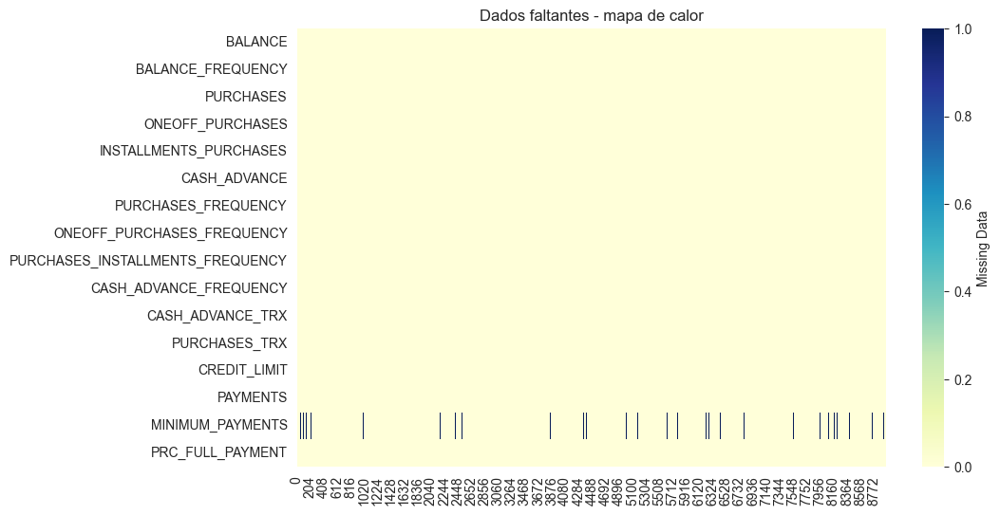

<Figure size 1000x600 with 0 Axes>

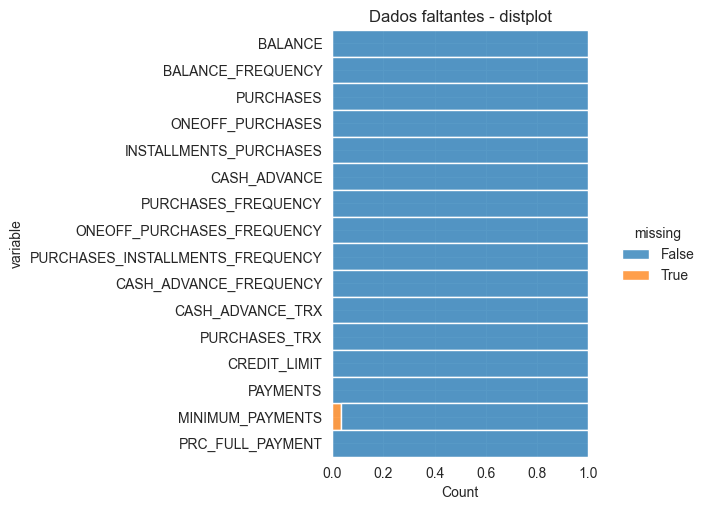

In [7]:
def plot_missing_values():
    #mapa de calor
    ax1 = plt.figure(figsize=(10,6))
    sns.heatmap((df.isna() + df.isin(['none'])).transpose(),
                cmap="YlGnBu",
                cbar_kws={'label': 'Missing Data'})
    plt.title("Dados faltantes - mapa de calor")
    plt.savefig("missing_value_heatmap.png", dpi=100)

    #distribuição
    ax2 = plt.figure(figsize=(10,6))
    sns.displot(
        data=(df.isna() + df.isin(['none'])).melt(value_name="missing"),
        y="variable",
        hue="missing",
        multiple="fill",
        aspect=1.25
    )
    plt.title("Dados faltantes - distplot")
    plt.savefig("/missing_values_distplot.png", dpi=100)

plot_missing_values()

Existem dados faltantes para pagamento de minimo do cartão, irei substituir esses valores faltantes pela mediana e no credit_limit vou retirar o registro, pois é somente 1 registro.

In [8]:
df.isnull().sum().sort_values(ascending=False)

MINIMUM_PAYMENTS                    313
CREDIT_LIMIT                          1
BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
PAYMENTS                              0
PRC_FULL_PAYMENT                      0
dtype: int64

In [9]:
df.dropna(subset=['CREDIT_LIMIT'], inplace=True)

In [10]:
df.MINIMUM_PAYMENTS.fillna(df.MINIMUM_PAYMENTS.median(), inplace=True)

In [11]:
df.isnull().sum().sort_values(ascending=False)

BALANCE                             0
BALANCE_FREQUENCY                   0
PURCHASES                           0
ONEOFF_PURCHASES                    0
INSTALLMENTS_PURCHASES              0
CASH_ADVANCE                        0
PURCHASES_FREQUENCY                 0
ONEOFF_PURCHASES_FREQUENCY          0
PURCHASES_INSTALLMENTS_FREQUENCY    0
CASH_ADVANCE_FREQUENCY              0
CASH_ADVANCE_TRX                    0
PURCHASES_TRX                       0
CREDIT_LIMIT                        0
PAYMENTS                            0
MINIMUM_PAYMENTS                    0
PRC_FULL_PAYMENT                    0
dtype: int64

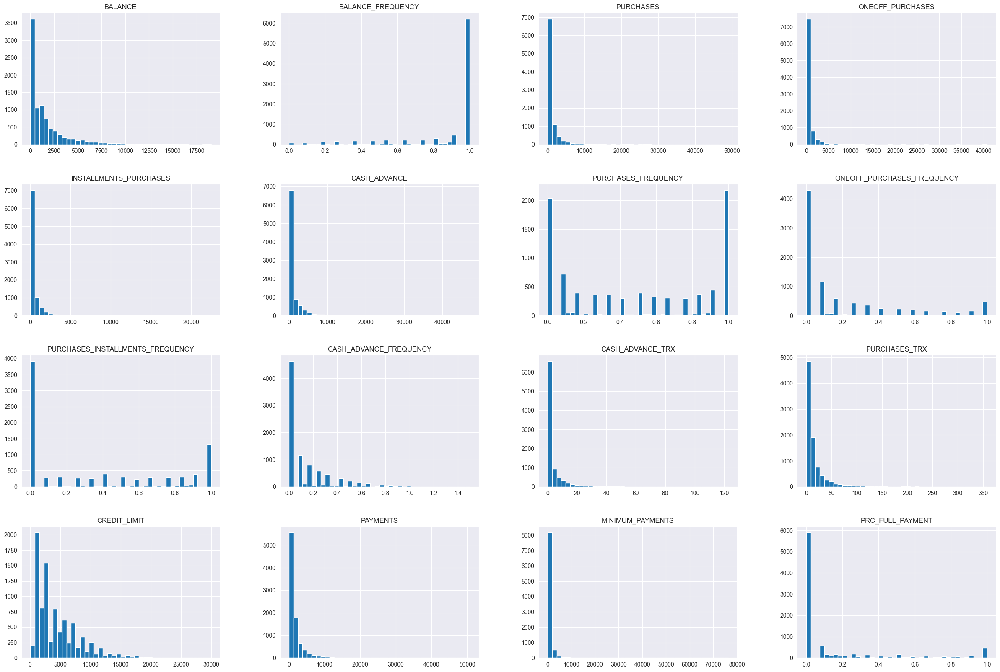

In [12]:
ax = df.hist(bins=40, figsize=(30,20))
ax = ax

É possil verificar que salva duas exceções, os dados apresentam assimetria à direita no geral, irei aplicar a normalização L1 inicialmente

# Pré-processamento II

## Normalização

In [13]:
from sklearn.preprocessing import Normalizer

Irei utilizar a normalização l2 (euclidiana) para deixar todos os valores entre 0 e 1.
Esse metódo basicamente escala um vetor de dados para que a  norma L2 do vetor (ou seja, a raiz quadrada da soma dos quadrados dos elementos do vetor) seja igual a 1

A fórmula matemática para normalização L2 é simplesmente dividir cada elemento do vetor pelo seu comprimento (ou seja, a norma L2 do vetor)
$$ v_norm = v /||v||$$

In [14]:
values_normalizer = Normalizer().fit_transform(df.values)
values_normalizer

array([[3.93555441e-02, 7.87271593e-04, 9.17958473e-02, ...,
        1.94178127e-01, 1.34239194e-01, 0.00000000e+00],
       [2.93875903e-01, 8.34231560e-05, 0.00000000e+00, ...,
        3.76516684e-01, 9.84037959e-02, 2.03923046e-05],
       [3.10798149e-01, 1.24560965e-04, 9.63068011e-02, ...,
        7.74852335e-02, 7.81351982e-02, 0.00000000e+00],
       ...,
       [2.27733092e-02, 8.11060955e-04, 1.40540698e-01, ...,
        7.90986945e-02, 8.02156174e-02, 2.43318384e-04],
       [2.65257948e-02, 1.64255731e-03, 0.00000000e+00, ...,
        1.03579625e-01, 1.09898221e-01, 4.92767391e-04],
       [1.86406219e-01, 3.33426837e-04, 5.46778061e-01, ...,
        3.15915455e-02, 4.41568390e-02, 0.00000000e+00]])

# Clusterização I

In [15]:
from sklearn.cluster import KMeans

In [16]:
#Cluster inicial com 5 cluster, e no máximo 300 iterações
kmeans = KMeans(n_clusters=5, n_init=10, max_iter=300)
y_pred = kmeans.fit_predict(values_normalizer)

## métricas de validação
    Silhouette

In [17]:
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
labels = kmeans.labels_
silhouette = silhouette_score(values_normalizer, labels, metric='euclidean')
calinski = calinski_harabasz_score(values_normalizer, labels)
dbs = davies_bouldin_score(values_normalizer, labels)
print('silhouette score: {}'.format(silhouette))
print('Davis Bouldin score: {}'.format(dbs))
print('Calinski harabasz score: {}'.format(calinski))

silhouette score: 0.3645105810189722
Davis Bouldin score: 1.0760690597578915
Calinski harabasz score: 3431.135277248616


O resultado obtido não está tão satisfatório, voltando as etapas de EDA e pré processamento (com base no CRISP-DM)

# EDA

- entendendo melhor as correlações - dataset original

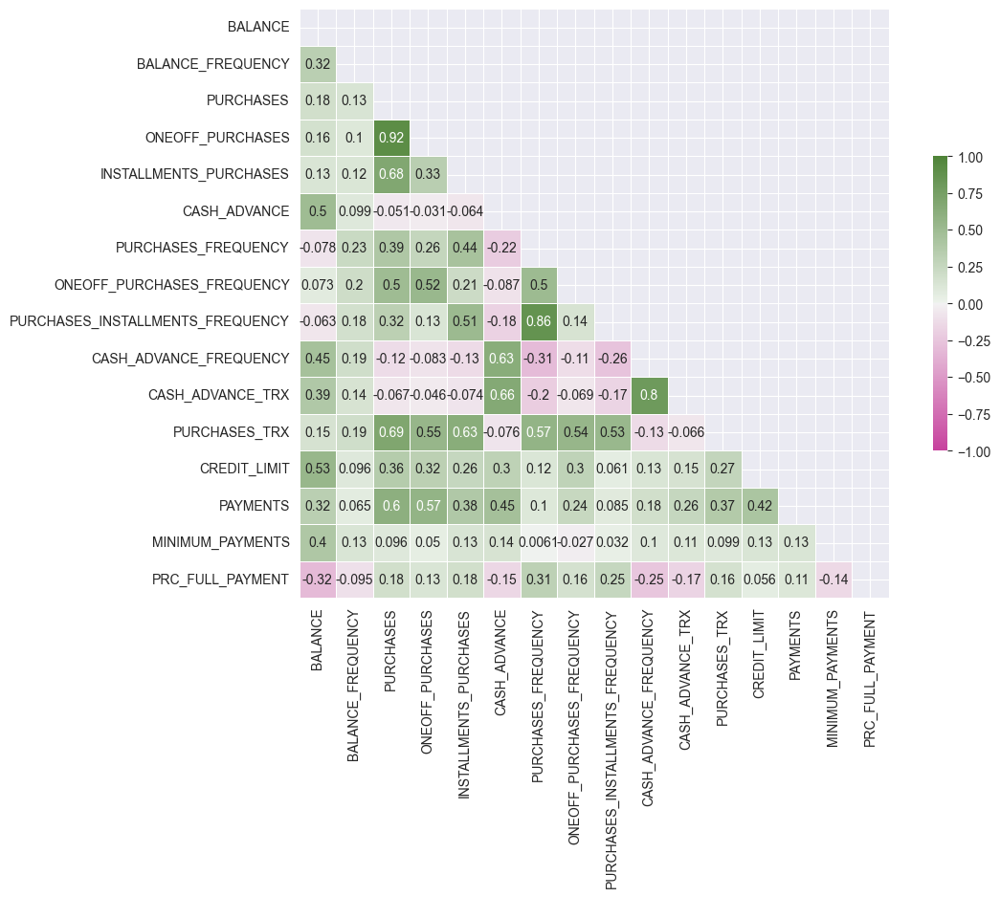

In [18]:
#Análise de correlação
corr = df.corr()
for c in range(len(corr)):
    corr.iloc[c,c] = 0
mask = np.triu(np.ones_like(corr, dtype=bool))
f, ax = plt.subplots(figsize=(12, 8))
cmap = sns.diverging_palette(330, 120, as_cmap=True)
sns.heatmap(corr, mask=mask, cmap=cmap, center=0, vmin=-1, vmax=1, annot=True,
            square=True, linewidths=.5, cbar_kws={"shrink": .5});

In [19]:
#Corr máxima e min
corr.abs().max().sort_values(ascending=False)

PURCHASES                           0.916844
ONEOFF_PURCHASES                    0.916844
PURCHASES_FREQUENCY                 0.862921
PURCHASES_INSTALLMENTS_FREQUENCY    0.862921
CASH_ADVANCE_FREQUENCY              0.799573
CASH_ADVANCE_TRX                    0.799573
PURCHASES_TRX                       0.689552
INSTALLMENTS_PURCHASES              0.679889
CASH_ADVANCE                        0.656493
PAYMENTS                            0.603252
ONEOFF_PURCHASES_FREQUENCY          0.544849
BALANCE                             0.531283
CREDIT_LIMIT                        0.531283
MINIMUM_PAYMENTS                    0.397905
BALANCE_FREQUENCY                   0.322335
PRC_FULL_PAYMENT                    0.319018
dtype: float64

É possivél observar forte correlação para as features a partir de CREDIT_LIMIT para cima, portanto, vizando melhorar a cluesterização obitida anteriormente, será feita a redução de dimensionalidade

In [20]:
from scipy.stats import skew

In [21]:
#verificando as colunaso viés pela assimetria
skewness = df.skew().sort_values(ascending= False)
skewness = skewness.loc[skewness > 1]
skewness

MINIMUM_PAYMENTS              13.851864
ONEOFF_PURCHASES              10.044622
PURCHASES                      8.143969
INSTALLMENTS_PURCHASES         7.298823
PAYMENTS                       5.907465
CASH_ADVANCE_TRX               5.720976
CASH_ADVANCE                   5.166323
PURCHASES_TRX                  4.630493
BALANCE                        2.393270
PRC_FULL_PAYMENT               1.942641
CASH_ADVANCE_FREQUENCY         1.828644
ONEOFF_PURCHASES_FREQUENCY     1.535453
CREDIT_LIMIT                   1.522464
dtype: float64

In [22]:
#colunas que não farei normalização (quando valor é 0 ou 1)
not_includ_col = []
for column in df.columns:
    if df[column].min() == 0 and df[column].max() == 1:
        not_includ_col.append(column)

In [23]:
not_includ_col

['BALANCE_FREQUENCY',
 'PURCHASES_FREQUENCY',
 'ONEOFF_PURCHASES_FREQUENCY',
 'PURCHASES_INSTALLMENTS_FREQUENCY',
 'PRC_FULL_PAYMENT']

Nas colunas acima vou aplicar a normalização por log, pela ampla variação e nas demais aplicarei StandardScaler, para preparar para o PCA

In [24]:
from sklearn.preprocessing import StandardScaler

skewed_cols = skewness.index.tolist()


# Lista de colunas a serem normalizadas
cols_to_normalize = list(set(df.columns) - set(skewed_cols))

df_normalizer = df.copy()

# aplicar a transformação logarítmica para as colunas selecionadas
df_normalizer[skewed_cols] = np.log1p(df_normalizer[skewed_cols])

# aplicar a StandardScaler para as colunas restantes
scaler = StandardScaler()
df_normalizer[df_normalizer.columns.difference(skewed_cols)] = scaler.fit_transform(df_normalizer[df_normalizer.columns.difference(skewed_cols)])


In [25]:
df_normalizer.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT
0,3.735304,-0.249881,4.568506,0.000000,4.568506,0.000000,-0.806649,0.000000,-0.707409,0.000000,0.000000,1.098612,6.908755,5.312231,4.945277,0.000000
1,8.071989,0.134049,0.000000,0.000000,0.000000,8.770896,-1.221928,0.000000,-0.917090,0.223144,1.609438,0.000000,8.853808,8.319725,6.978531,0.200671
2,7.822504,0.517980,6.651791,6.651791,0.000000,0.000000,1.269742,0.693147,-0.917090,0.000000,0.000000,2.564949,8.922792,6.434654,6.442994,0.000000
3,7.419183,-1.017743,7.313220,7.313220,0.000000,5.331694,-1.014290,0.080042,-0.917090,0.080042,0.693147,0.693147,8.922792,0.000000,5.747647,0.000000
4,6.707735,0.517980,2.833213,2.833213,0.000000,0.000000,-1.014290,0.080042,-0.917090,0.000000,0.000000,0.693147,7.090910,6.521114,5.504483,0.000000


In [26]:
df_normalizer.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT
count,8949.000000,8.949000e+03,8949.000000,8949.000000,8949.000000,8949.000000,8.949000e+03,8949.000000,8.949000e+03,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000
mean,6.161994,-3.144205e-16,4.900195,3.204632,3.352778,3.318872,7.701715e-17,0.158717,4.605149e-17,0.113508,0.817584,1.894942,8.094835,6.625023,5.916446,0.117743
std,2.013132,1.000056e+00,2.916575,3.246370,3.082942,3.566440,1.000056e+00,0.216678,1.000056e+00,0.156724,1.009372,1.373787,0.819674,1.591197,1.169510,0.211625
min,0.000000,-3.705263e+00,0.000000,0.000000,0.000000,0.000000,-1.221928e+00,0.000000,-9.170895e-01,0.000000,0.000000,0.000000,3.931826,0.000000,0.018982,0.000000
25%,4.862644,4.873144e-02,3.708682,0.000000,0.000000,0.000000,-1.014290e+00,0.000000,-9.170895e-01,0.000000,0.000000,0.693147,7.378384,5.951379,5.146771,0.000000
50%,6.773858,5.179802e-01,5.892997,3.663562,4.499810,0.000000,2.390672e-02,0.080042,-4.977267e-01,0.000000,0.000000,2.079442,8.006701,6.754677,5.747647,0.000000
75%,7.628213,5.179802e-01,7.013169,6.361009,6.151988,7.016492,1.062103e+00,0.262364,9.700395e-01,0.200671,1.609438,2.890372,8.779711,7.550808,6.671680,0.133531
max,9.854515,5.179802e-01,10.800403,10.615512,10.021315,10.760839,1.269742e+00,0.693147,1.599083e+00,0.916291,4.820282,5.883322,10.308986,10.834125,11.243832,0.693147


In [27]:
df_normalizer.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT
0,3.735304,-0.249881,4.568506,0.000000,4.568506,0.000000,-0.806649,0.000000,-0.707409,0.000000,0.000000,1.098612,6.908755,5.312231,4.945277,0.000000
1,8.071989,0.134049,0.000000,0.000000,0.000000,8.770896,-1.221928,0.000000,-0.917090,0.223144,1.609438,0.000000,8.853808,8.319725,6.978531,0.200671
2,7.822504,0.517980,6.651791,6.651791,0.000000,0.000000,1.269742,0.693147,-0.917090,0.000000,0.000000,2.564949,8.922792,6.434654,6.442994,0.000000
3,7.419183,-1.017743,7.313220,7.313220,0.000000,5.331694,-1.014290,0.080042,-0.917090,0.080042,0.693147,0.693147,8.922792,0.000000,5.747647,0.000000
4,6.707735,0.517980,2.833213,2.833213,0.000000,0.000000,-1.014290,0.080042,-0.917090,0.000000,0.000000,0.693147,7.090910,6.521114,5.504483,0.000000


## PCA

In [28]:
# aplicar PCA
from sklearn.decomposition import PCA
import pandas as pd
import numpy as np

pca_results = pd.DataFrame(columns=['n', 'model', 'Var explicada'])

for n_components in range(1,len(df_normalizer.columns)+1):
    pca = PCA(n_components=n_components)
    pca.fit(df_normalizer)

    # exibir o percentual de variância explicada por cada componente
    var_exp = pca.explained_variance_ratio_
    var_exp_df = pd.DataFrame({'n': n_components, 'model': pca, 'Var explicada': var_exp.sum()}, index=[0])

    # calcular e exibir os pesos e contribuições de cada feature
    weights = pca.explained_variance_.reshape(-1, 1) / pca.explained_variance_.sum()
    component_contrib = np.abs(pca.components_) * weights
    features_values = component_contrib.sum(axis=0)
    features_weight = pd.DataFrame({'n': n_components,'Feature': df_normalizer.columns, 'values': features_values})

    # concatena os resultados
    pca_results = pd.concat([pca_results, var_exp_df])

pca_results


,n,model,Var explicada
0,1,PCA(n_components=1),0.478857
0,2,PCA(n_components=2),0.710830
0,3,PCA(n_components=3),0.855522
0,4,PCA(n_components=4),0.910618
0,5,PCA(n_components=5),0.941774
0,6,PCA(n_components=6),0.958188
0,7,PCA(n_components=7),0.971489
0,8,PCA(n_components=8),0.980310
0,9,PCA(n_components=9),0.988195
0,10,PCA(n_components=10),0.992869


Observa-se que a partir de n = 13, começa a estagnação, portanto, reduzirei o num de features para 13.

In [29]:
pca_13 = pca_results[pca_results['n'] == 13]
pca_13 = pca_13.loc[pca_13.index[0], 'n']  # acessa pelo rótulo do índice da linha e nome da coluna
pca_13

13

In [30]:
pca = PCA(n_components=pca_13)
pca.fit(df_normalizer)
df_new = pd.DataFrame(pca.fit_transform(df_normalizer)[:, :pca_13], columns=[df_normalizer.columns[i] for i in range(pca_13)])

In [31]:
df_new.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT
0,0.787205,-5.609227,0.549309,0.102811,0.172332,0.192120,0.020267,1.207710,-0.795630,-0.765893,-0.092029,-0.448398,-0.005200
1,-9.060240,1.595839,1.160270,-1.073806,-1.415729,-0.322259,0.497635,-0.449051,0.147565,0.129504,-0.574198,0.020421,-0.045067
2,2.558641,1.359339,-4.975699,-2.568546,0.865904,1.184635,-0.239328,-1.289258,0.310463,0.649797,0.142896,-0.281357,-0.925472
3,-0.635684,2.732603,-4.951478,3.072287,6.193363,0.915494,1.248722,-0.559381,-2.000217,0.765011,-0.361604,0.906578,0.033788
4,-1.536849,-2.674034,-3.675626,-2.862379,-0.076734,-0.275278,-0.743803,0.689017,-0.200979,0.184311,0.114938,0.045723,0.143639


# Encontrando a qtd ideal de clusters - valor de K.

## Elbow method

In [32]:
def elbow_method(df_new):

    kmeans_per_k = [KMeans(n_clusters=k, random_state=42, n_init=10, max_iter=300).fit(df_new) for k in range(1, 20)]
    inertias = [model.inertia_ for model in kmeans_per_k]

    #calcula a diferença das inércias adjacentes, encontra o valor máximo para diff2 e soma 2 para encontrar o valor ideal de clusters
    diff = [inertias[i] - inertias[i-1] for i in range(1, len(inertias))]
    diff2 = [diff[i] - diff[i-1] for i in range(1, len(diff))]
    ideal_k = diff2.index(max(diff2)) + 4
    plt.figure(figsize=(8, 4))
    plt.plot(range(1, 20), inertias, "bo-")
    plt.xlabel('Number of Clusters(k)')
    plt.ylabel('Inertia')
    plt.annotate('Elbow, ideal k = {}'.format(ideal_k),
                 xy=(ideal_k, inertias[ideal_k-1]),
                 xytext=(0.55, 0.55),
                 textcoords='figure fraction',
                 fontsize=16,
                 arrowprops=dict(facecolor='black', shrink=0.1))
    plt.title('Elbow Method')
    plt.show()
    return  kmeans_per_k


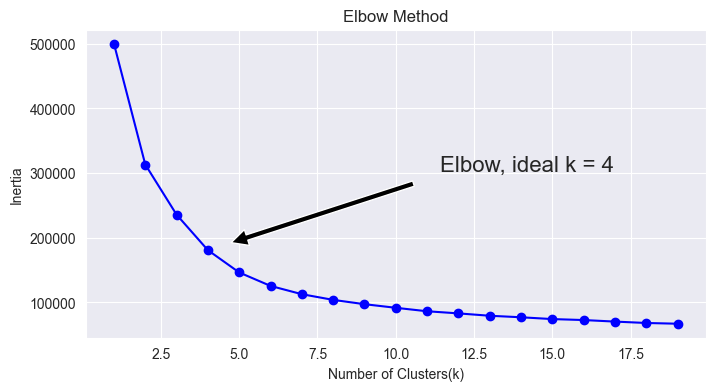

In [33]:
kmeans_per_k = elbow_method(df_new)


In [34]:
print(kmeans_per_k[3])

KMeans(n_clusters=4, n_init=10, random_state=42)


### Aqui, vou avaliar a distribuição dos pontos com 2 dimensões e 4 clusters.

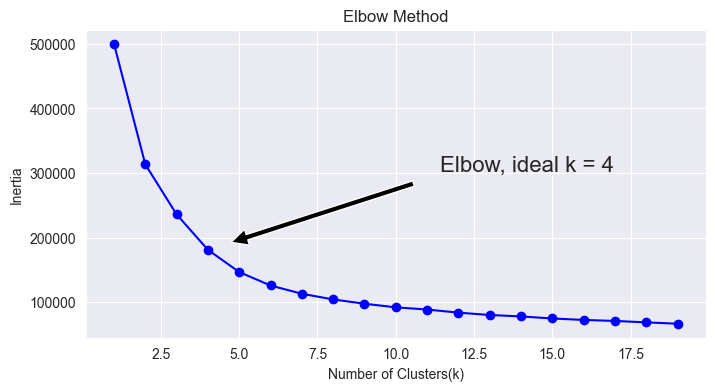

[KMeans(n_clusters=1, n_init=10, random_state=42),
 KMeans(n_clusters=2, n_init=10, random_state=42),
 KMeans(n_clusters=3, n_init=10, random_state=42),
 KMeans(n_clusters=4, n_init=10, random_state=42),
 KMeans(n_clusters=5, n_init=10, random_state=42),
 KMeans(n_clusters=6, n_init=10, random_state=42),
 KMeans(n_clusters=7, n_init=10, random_state=42),
 KMeans(n_init=10, random_state=42),
 KMeans(n_clusters=9, n_init=10, random_state=42),
 KMeans(n_clusters=10, n_init=10, random_state=42),
 KMeans(n_clusters=11, n_init=10, random_state=42),
 KMeans(n_clusters=12, n_init=10, random_state=42),
 KMeans(n_clusters=13, n_init=10, random_state=42),
 KMeans(n_clusters=14, n_init=10, random_state=42),
 KMeans(n_clusters=15, n_init=10, random_state=42),
 KMeans(n_clusters=16, n_init=10, random_state=42),
 KMeans(n_clusters=17, n_init=10, random_state=42),
 KMeans(n_clusters=18, n_init=10, random_state=42),
 KMeans(n_clusters=19, n_init=10, random_state=42)]

In [35]:
kmeans_per_k = elbow_method(df_normalizer)
kmeans_per_k

In [36]:
reduced_data = PCA(n_components=2).fit_transform(df_normalizer)
kmeans = KMeans(n_clusters=4, n_init=10)
kmeans.fit(reduced_data)

def plot_data(X):
    plt.plot(X[:, 0], X[:, 1], 'k.', markersize=2)

def plot_centroids(centroids, weights=None, circle_color='w', cross_color='k'):
    """ Calcula e marcar o centroide de cada cluster """
    if weights is not None:
        centroids = centroids[weights > weights.max() / 10]
    plt.scatter(centroids[:, 0], centroids[:, 1],
                marker='o', s=35, linewidths=8,
                color=circle_color, zorder=10, alpha=0.9)
    plt.scatter(centroids[:, 0], centroids[:, 1],
                marker='x', s=2, linewidths=12,
                color=cross_color, zorder=11, alpha=1)

def plot_decision_boundaries(clusterer, X, resolution=1000, show_centroids=True, show_xlabels=True, show_ylabels=True):
    """ Marcação das fronteiras entre os clusters """
    mins = X.min(axis=0) - 0.1
    maxs = X.max(axis=0) + 0.1
    xx, yy = np.meshgrid(np.linspace(mins[0], maxs[0], resolution), np.linspace(mins[1], maxs[1], resolution))

    Z = clusterer.predict(np.c_[xx.ravel(), yy.ravel()])

    Z = Z.reshape(xx.shape)

    plt.contourf(Z, extent=(mins[0], maxs[0], mins[1], maxs[1]),
                cmap="Pastel2")
    plt.contour(Z, extent=(mins[0], maxs[0], mins[1], maxs[1]),
                linewidths=1, colors='k')
    plot_data(X)
    if show_centroids:
        plot_centroids(clusterer.cluster_centers_)

    if show_xlabels:
        plt.xlabel("$x_1$", fontsize=14)
    else:
        plt.tick_params(labelbottom=False)
    if show_ylabels:
        plt.ylabel("$x_2$", fontsize=14, rotation=0)
    else:
        plt.tick_params(labelleft=False)


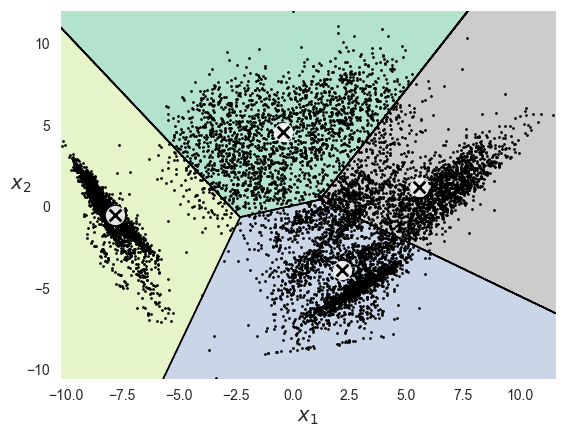

In [37]:
plot_decision_boundaries(kmeans, reduced_data)
plt.show()


Observa-se que vários não estão tão bem distribuidos, com alta dispesão entre os pontos dentro de um cluster, vários pontos nas fronteiras e além delas. O centroide parace estar ok, mas a redução de dimensionalidade para 2 influenciou bastante e a quantidade de cluster igual a 4 pode ainda não ser acertiva. Portanto, continuarei agora com um metódo mais refinado, o Silhouette.

## Silhouette

O coeficiente de Silhouette nos fornece o qual bem distribuidos os pontos estão nos clusters.
- -1: quanto mais próximo, pode indicar atribuição ao cluster errado
- +1: quanto mais próximo, mais a instância está dentro do próprio cluster
- 0: fronteira do cluster

Cálculo:
$$ SC = (b-a) / max(a,b)$$

Onde:
- (b-a) representa a compacção
- max(a,b) representa a separação

In [38]:
print("silhouette PCA 2:  ",silhouette_score(reduced_data, kmeans.labels_))
print("silhouette PCA 13:  ",silhouette_score(df_new, kmeans_per_k[3].labels_))

silhouette PCA 2:   0.5227468401694552
silhouette PCA 13:   0.3827129012817027


In [39]:
silhouette_scores = [silhouette_score(df_new, model.labels_) for model in kmeans_per_k[1:]]
silhouette_scores

[0.36056627455443935,
 0.36226878365756204,
 0.3827129012817027,
 0.406118108194602,
 0.418859350753731,
 0.43483795625972715,
 0.4010400066063621,
 0.3353283510077041,
 0.32281296471476606,
 0.316052811814051,
 0.2780159294622468,
 0.2740995353349237,
 0.2729389318893375,
 0.27261247660565535,
 0.2621308255920615,
 0.2565016781726388,
 0.24619009222039237,
 0.2532012618759516]

In [40]:
import numpy as np
import matplotlib.pyplot as plt

def plot_silhouette_scores(silhouette_scores, max_clusters):
    """ Plota o"""
    plt.figure(figsize=(8, 3))
    plt.plot(range(2, max_clusters+1), silhouette_scores, "bo-")
    plt.xlabel("$k$", fontsize=14)
    plt.ylabel("Silhouette score", fontsize=14)
    plt.axis([1, max_clusters+1, np.min(silhouette_scores)-0.05, np.max(silhouette_scores)+0.05])
    plt.savefig("silhouette_score_vs_k_plot.png")
    plt.show()


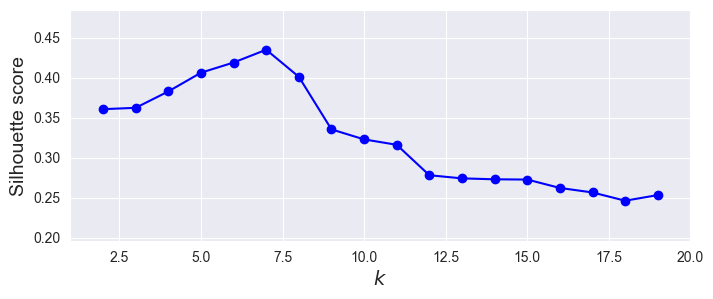

In [41]:
max_clusters = len(silhouette_scores)+1
plot_silhouette_scores(silhouette_scores, max_clusters)

No gráfico acima, aparentemente a quantidade ideal de clusters para se trabalhar com um PCA de 11 está entre 6 e 7, talvez 4 clusters como obtido no elbow não seja o melhor.

### Silhouette diagram

C:\Users\barba\AppData\Local\Temp\ipykernel_3700\1996899205.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = mpl.cm.get_cmap("Spectral")
C:\Users\barba\AppData\Local\Temp\ipykernel_3700\1996899205.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = mpl.cm.get_cmap("Spectral")
C:\Users\barba\AppData\Local\Temp\ipykernel_3700\1996899205.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = mpl.cm.get_cmap("Spectral")
C:\Users\barba\AppData\Local\Temp\ipy

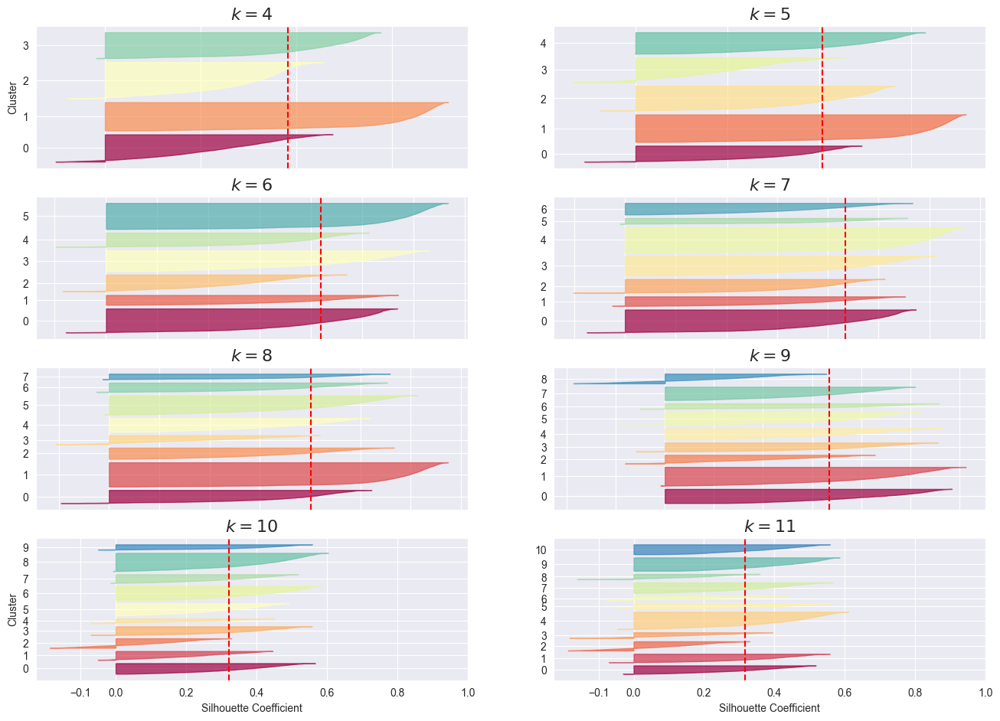

In [42]:
from sklearn.metrics import silhouette_samples
from matplotlib.ticker import FixedLocator, FixedFormatter
import matplotlib as mpl

plt.figure(figsize=(16, 14))

for k in (4,5, 6, 7, 8, 9, 10, 11):
    plt.subplot(5, 2, k - 1)

    y_pred = kmeans_per_k[k - 1].labels_
    silhouette_coefficients = silhouette_samples(df_new, y_pred)

    padding = len(df_new) // 30
    pos = padding
    ticks = []
    for i in range(k):
        coeffs = silhouette_coefficients[y_pred == i]
        coeffs.sort()
        cmap = mpl.cm.get_cmap("Spectral")
        color = cmap(i / k)
        plt.fill_betweenx(np.arange(pos, pos + len(coeffs)), 0, coeffs,
                          facecolor=color, edgecolor=color, alpha=0.7)
        ticks.append(pos + len(coeffs) // 2)
        pos += len(coeffs) + padding

    plt.gca().yaxis.set_major_locator(FixedLocator(ticks))
    plt.gca().yaxis.set_major_formatter(FixedFormatter(range(k)))
    if k in (4, 10):
        plt.ylabel("Cluster")

    if k in (10, 11):
        plt.gca().set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
        plt.xlabel("Silhouette Coefficient")
    else:
        plt.tick_params(labelbottom=False)

    plt.axvline(x=silhouette_scores[k - 2], color="red", linestyle="--")
    plt.title("$k={}$".format(k), fontsize=16)

plt.savefig("silhouette_analysis_plot.png")
plt.show()

Com o resultado acima, é possivél observar que o tracejado corta todos os clusters até l=7, depois disso algum fica de fora. O tamanho dos cluster são bem próximos em K=4, mas em K=5 observa-se a divisão clara de um grupo que estava sendo considerado um cluster em k=4. Já em K=6 e K=7, apesar de apresentarem o melhor coeficiente, o tamanho dos clusters não são similares. Portanto, k=5 parece ser a melhor opção aqui.

### Novo dataset com o cluster para cada registro

In [43]:
#clusterização com 5 clusters
k = 5
kmeans_5 = KMeans(n_clusters=k, random_state=42, n_init=10, max_iter=300).fit(df_new)


In [44]:
# Extração dos labels
labels1 = kmeans_5.labels_
labels1

array([2, 1, 0, ..., 2, 1, 0])

In [45]:
# Shape dos labels
labels1.shape

(8949,)

In [46]:
# Converte o array para dataframe
df_labels = pd.DataFrame(labels1)

#### Criando o DataFrame com Clusters - no dataframe original, não no normalizado

In [47]:
# Adicionado a Coluna com as labels dos clusters
df_clustered = df.merge(df_labels, left_index = True, right_index = True)
# Renomeado o coluna das Labels para "CLUSTERS"
df_clustered.rename(columns={ 0:"CLUSTER"}, inplace=True)
df_clustered.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,CLUSTER
0,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,2
1,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,1
2,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,0
3,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,312.452292,0.000000,0
4,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,0


Agora, com esses dados rotulados, é possivél trabalhar com algoritmos supervisionados e semi-supervisionados. Mas antes, vou explorar um pouco o novo dataset com base nos clusters.

## EDA - Análise dos Clusters

In [48]:
df_clustered.groupby("CLUSTER").aggregate("count")

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT
CLUSTER,,,,,,,,,,,,,,,,
0,1248,1248,1248,1248,1248,1248,1248,1248,1248,1248,1248,1248,1248,1248,1248,1248
1,2146,2146,2146,2146,2146,2146,2146,2146,2146,2146,2146,2146,2146,2146,2146,2146
2,1944,1944,1944,1944,1944,1944,1944,1944,1944,1944,1944,1944,1944,1944,1944,1944
3,1937,1937,1937,1937,1937,1937,1937,1937,1937,1937,1937,1937,1937,1937,1937,1937
4,1673,1673,1673,1673,1673,1673,1673,1673,1673,1673,1673,1673,1673,1673,1673,1673


Com exceção do CLUSTER 1, a quantidade de registros em cada cluster está bem distribuida

<Axes: xlabel='CLUSTER'>

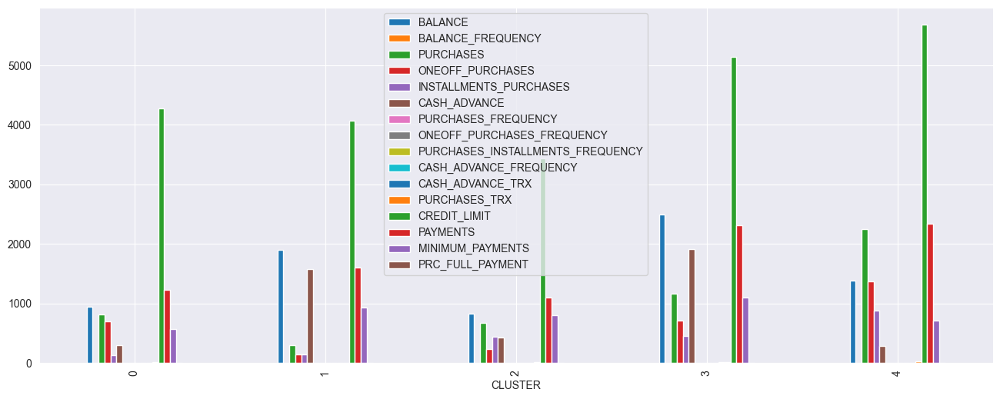

In [49]:
# Criação do gráfico de barras para análise dos clusters
df_clustered.groupby('CLUSTER').aggregate("mean").plot.bar(figsize=(16,6))

Pronto, agora temos labels informando a qual grupo pertence cada cliente. Voltamos a trabalhar com o dataset original com a adição dessa informação porque no dataset normalizado "surgiram" valores negativos no dataset e fora do intervalo [-1,1], isso se dá deviso a alta assimetria e dispersão dos dados do dataset. Isso não influência na análise dos clusters, mas dificulta a interpretação dos resultados, visto que sequer tinhamos resultados negativos no antigo dataset e não termos descrição para esse cenário do mapa de campos.

# Montando o perfil de cada grupo

In [50]:
df_clustered.CLUSTER.value_counts().sort_index()

CLUSTER
0    1248
1    2146
2    1944
3    1937
4    1673
Name: count, dtype: int64

<Axes: xlabel='BALANCE', ylabel='PURCHASES'>

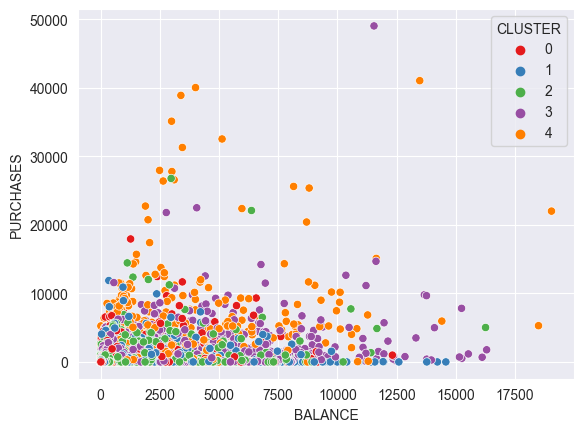

In [51]:
sns.set_palette('Set2')
sns.scatterplot(data=df_clustered, x='BALANCE', y='PURCHASES', hue=df_clustered['CLUSTER'],palette='Set1')

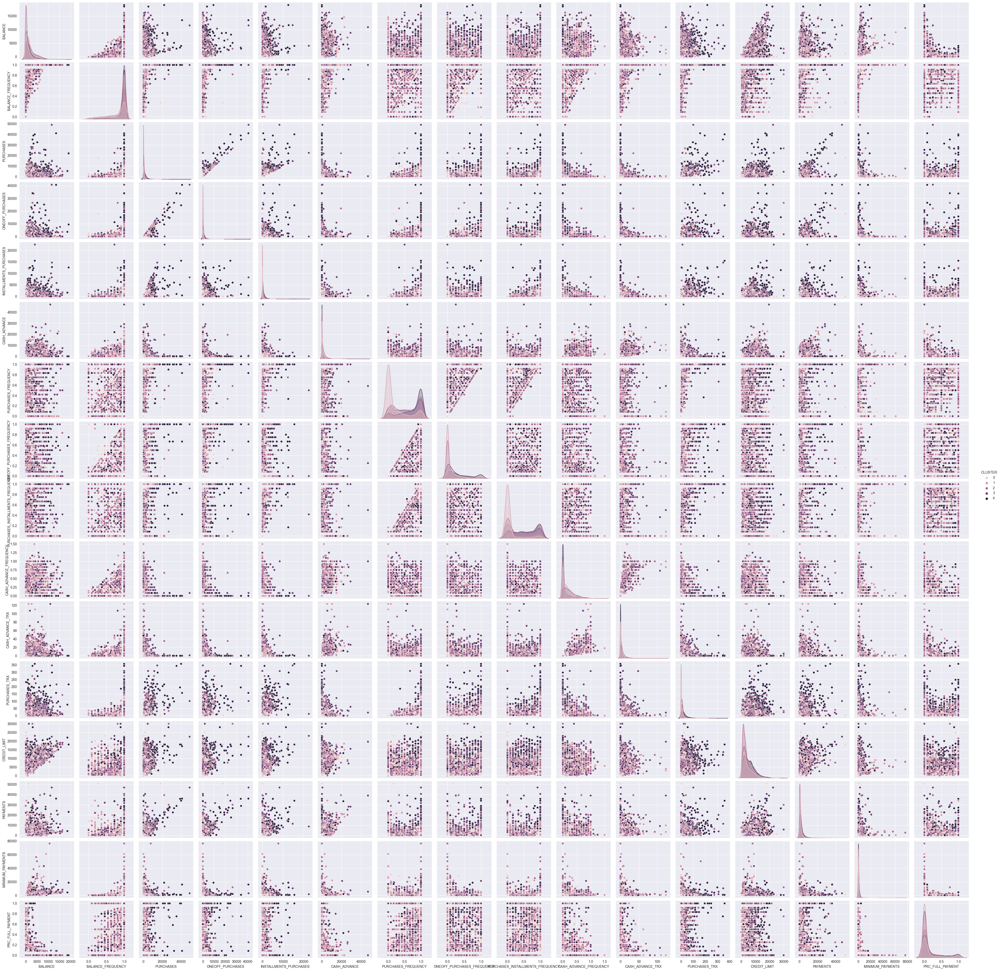

In [52]:
# make a Seaborn pairplot
sns.pairplot(df_clustered, hue='CLUSTER')

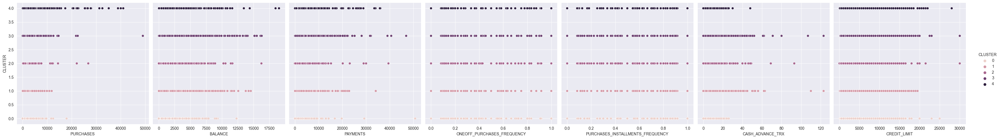

In [53]:
sns.pairplot(df_clustered, hue='CLUSTER', x_vars=df_clustered[['PURCHASES','BALANCE', 'PAYMENTS', 'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_TRX', 'CREDIT_LIMIT']], y_vars=['CLUSTER'],  height=5, aspect=1)


In [54]:
df_clustered.groupby('CLUSTER')[['PURCHASES','BALANCE', 'PAYMENTS', 'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY','CASH_ADVANCE_TRX', 'CREDIT_LIMIT']].mean()

,PURCHASES,BALANCE,PAYMENTS,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_TRX,CREDIT_LIMIT
CLUSTER,,,,,,,
0,816.230561,938.991447,1224.371298,0.289340,0.145301,1.113782,4280.256896
1,293.102484,1898.923392,1606.484496,0.060962,0.164952,4.965517,4065.244382
2,671.057402,820.242527,1101.316650,0.086550,0.501520,1.773148,3438.662629
3,1164.732834,2499.475222,2314.788314,0.251683,0.405778,6.187403,5140.170940
4,2253.026449,1385.937057,2337.913705,0.396679,0.577073,0.953975,5685.942509


In [55]:
df_clustered.CLUSTER.value_counts()

CLUSTER
1    2146
2    1944
3    1937
4    1673
0    1248
Name: count, dtype: int64

# Análise final

Cluster 0:É o grupo mais equilibrado, com comprar únicas altas (pode estar usando o cartão para gerar pontos), mas também realiza uma quantidade consideravél de compras parceladas, além de ser o menor grupo. <strong>Potêncial bom</strong>.
Cluster 1: Gastam pouco, algumas caracteristicas parecidas com o cluster 0, mas com o diferencial de ser o maior grupo, e ser um dos que mais transações com dinheiro adiantado. <strong>Foco: Pontos</strong>.
Cluster 2: Esse grupo tem alguns outliers, mas no geral, os usuários frequentemente pagam valores altos, mas compram menos, então o indice de compra nesse grupo é o menor até agora. <strong>Potêncial médio</strong>.
Cluster 3: Segundo maior gastador dos grupos, apesar de ter uma quantidade de pontos próxima ao cluster 2, tem o comportamento bem diferente, com clientes que compram bastante tanto em compra única quanto parcelado, têm o segundo maior limite do grupo e usam mais transações com dinheiro adiantado. <strong>Foco: Pontos</strong>.
Cluster 4: Cliente que mais gastam, com maior limite de crédito, maiores pagamentos. <strong>Potêncial alto</strong>.

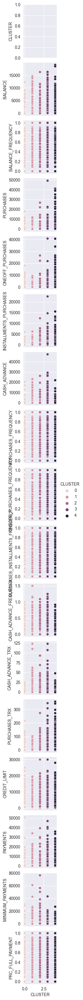

In [56]:
# Configurando o pairplot
sns.pairplot(df_clustered, hue='CLUSTER', x_vars=["CLUSTER"], y_vars=["CLUSTER"]+list(df_clustered.columns[:-1]), height=2, aspect=1, diag_kws={'sharey': False})
